<a href="https://colab.research.google.com/github/yfb2022/CONTEST_CULTURE/blob/main/clustertour.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Collecting

In [ ]:
import os
import sys
import urllib.request
import pandas as pd
import json
import re

client_id = "3fkB0d2U54K9GBL0n14H"
client_secret = "a75kN2rIal"

region = ['철원','화천','양구','인제','고성','춘천','속초','양양','홍천',
          '강릉','횡성','평창','정선','동해','삼척','태백','영월','원주']

idx = 0       # 여러개 정보 받을 때 횟수 카운트 용
display = 100 # 100개 단위로 정보 받아오기
start = 1     # 첫 시작점
end = 1000    # 마지막 시작점

blog_df = pd.DataFrame(columns=('Region Name', 'Title', 'Link', 'Description', 'Blogger Name', 'Blogger Link'))

for i in region:
  query = urllib.parse.quote(f"{i} 여행")
  for start_index in range(start, end, display):
    url = "https://openapi.naver.com/v1/search/blog?query=" + query \
    + '&display=' + str(display) \
    + '&start=' + str(start_index)
    request = urllib.request.Request(url)
    request.add_header("X-Naver-Client-Id",client_id)
    request.add_header("X-Naver-Client-Secret",client_secret)
    response = urllib.request.urlopen(request)
    rescode = response.getcode()
    if(rescode==200):
      response_body = response.read()
      response_dict = json.loads(response_body.decode('utf-8'))
      items = response_dict['items']
      for item_index in range(0, len(items)):
        remove_tag = re.compile('<.*?>')
        title = re.sub(remove_tag, '', items[item_index]['title'])
        link = items[item_index]['link']
        description = re.sub(remove_tag, '', items[item_index]['description'])
        blogger_name = items[item_index]['bloggername']
        blogger_link = items[item_index]['bloggerlink']
        region_name = i
        blog_df.loc[idx] = [region_name, title, link, description, blogger_name, blogger_link]
        idx += 1
    else:
      print("Error Code:" + rescode)

blog_df.head()

,Region Name,Title,Link,Description,Blogger Name,Blogger Link
0,철원,기념품샵 오늘의 농부 - 철원오대쌀 마그넷 철원 여행 기념품,https://zomzom.tistory.com/5961,강원도 철원군 여행 가서 철원 여행 기념품으로 철원오대쌀 마그넷을 구했어요. 여행 ...,좀좀이의 여행,https://zomzom.tistory.com/
1,철원,[철원여행]군제대후 23년만에~(23.5.27~28),https://blog.naver.com/jjin1979/223116978043,그리고 와수리에서 제일큰 마트에서 철원쌀 10키로 사서 집에 복귀했답니다. 오랫만에...,인생은 구라다! 구라쟁이&apos;s Family~,blog.naver.com/jjin1979
2,철원,"[철원여행] 한탄강 주상절리길, 잔도",https://blog.naver.com/seoldj/222621731771,강원도 철원군 갈말읍 군탄리 산 174-3 &lt;주상절리길 잔도 안내도&gt; /...,사랑을 만나러... 길을 나서다,blog.naver.com/seoldj
3,철원,소이산 모노레일 예약 후 방문한 DMZ 철원여행,https://blog.naver.com/iloveyangju/223111988892,인터넷 예약후에는 알림을 통해 다시 알려주기에 여행을 다니는 입장에서 간혹 발생하는...,경기북부 여행,blog.naver.com/iloveyangju
4,철원,철원 여행 DMZ 아트하우스 작가의 전시도 보고 체험도 하고~!,https://blog.naver.com/bo1026/223161346372,"이곳 철원 DMZ 아트하우스 팜플렛을 보니 철원 여행코스도 잘 되어 있고, 작가님의...",사랑이의 행복한 여행,blog.naver.com/bo1026


In [ ]:
blog_df.to_csv('blog_df.csv')

In [ ]:
import pandas as pd
import re
blog_df = pd.read_csv('/content/drive/MyDrive/blog_df.csv')
del blog_df['Unnamed: 0']
blog_df['Title'] = blog_df['Title'].apply(lambda x: re.sub('[^가-힣a-zA-Z\s]', '', x))
blog_df['Description'] = blog_df['Description'].apply(lambda x: re.sub('[^가-힣a-zA-Z\s]','',x))

In [ ]:
!pip install konlpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.4/19.4 MB 30.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 465.3/465.3 kB 19.6 MB/s eta 0:00:00


In [ ]:
from konlpy.tag import Okt
okt = Okt()
df = pd.DataFrame(columns=('Region Name', 'Nouns'))
num = 0
for i in blog_df['Region Name'].unique():
  title = blog_df.loc[blog_df['Region Name'] == i]['Title']
  description = blog_df.loc[blog_df['Region Name'] == i]['Description']
  title = title.apply(lambda x: okt.nouns(x)).explode().tolist()
  description = description.apply(lambda x: okt.nouns(x)).explode().tolist()
  df.loc[num] = [i, title + description]
  num += 1

In [ ]:
removal_word =  ['곳','여행지','월','추천','수','관광','년','일','것','국내','박일',
                 '코스','진','이번','박','때','후기','시간','더','날','여행']

removal_region = df['Region Name'].unique().tolist()
removal_region.extend(['강원','강원도','강릉시','동해시','삼척시','속초시','원주시','춘천시','태백시',
                       '고성군','양구군','양양군','영월군','인제군','정선군','철원군','평창군','홍천군','화천군','횡성군'])
removal = removal_word + removal_region

In [ ]:
def remove_stop_words(word_list):
    return [word for word in word_list if word not in removal]

df['Nouns'] = df['Nouns'].apply(remove_stop_words)
df

,Region Name,Nouns
0,철원,"[기념품, 오늘, 농부, 쌀, 마그넷, 기념품, 대후, 한탄강, 주상절리, 길, 잔..."
1,화천,"[산천어, 축제, 낚시, 방송, 역대, 마음, 숙소, 에어비앤비, 우리나라, 최, ..."
2,양구,"[수골, 캠프, 촌, 카라반, 캠핑장, 한반도, 섬, 산책, 특별자치도, 수목원, ..."
3,인제,"[월숲, 스테이, 선, 유재, 독채, 펜션, 여름, 휴가, 설악산, 국립공원, 계곡..."
4,고성,"[거진항, 수산시장, 회, 센터, 가성, 비, 최고, 카페, 핫, 베드, 해, 터,..."
5,춘천,"[이상원, 미술관, 스테이, 리뷰, 편, 레고랜드, 주차, 오픈, 아이, 단, 둘,..."
6,속초,"[가성, 비, 숙소, 대수, 리조트, 시내, 거리, 개월, 아기, 일정, 숙소, 음..."
7,양양,"[일정, 정리, 서핑, 및, 맛집, 투어, 청주, 죽도, 섬, 죽, 도정, 관광지,..."
8,홍천,"[엑소, 태깡, 아사히, 생맥주, 웰, 니스, 힐리, 언스, 선, 마을, 야외, 부..."
9,강릉,"[애견, 동반, 경리, 해수욕장, 흑임자, 커피, 짬뽕, 순두부, 동화, 가든, 본..."


In [ ]:
from collections import Counter
for i in range(len(df)):
  print(Counter(df.iloc[i]['Nouns']).most_common(10))

[('고석정', 681), ('한탄강', 532), ('폭포', 416), ('주상절리', 304), ('길', 279), ('맛집', 192), ('당사', 182), ('꽃밭', 179), ('노동', 172), ('부연', 159), ('직탕', 156), ('이산', 148), ('은하', 120), ('수교', 119), ('공원', 109), ('모노레일', 97), ('오늘', 94), ('당일치기', 92), ('방문', 91), ('카페', 91), ('겨울', 90), ('중', 90), ('도피안사', 89), ('물', 83), ('포천', 79), ('관광지', 78), ('백마', 78), ('꼭', 74), ('지질', 73), ('철원역', 72)]
[('축제', 561), ('산천어', 539), ('마을', 229), ('겨울', 225), ('파로호', 178), ('평화', 169), ('길', 162), ('펜션', 155), ('맛집', 142), ('얼음', 134), ('비수구미', 122), ('거리', 100), ('나무', 97), ('사랑', 91), ('체험', 89), ('평화의댐', 89), ('댐', 88), ('산', 87), ('섬', 87), ('가족', 86), ('산소', 78), ('붕어', 77), ('가을', 74), ('세계', 72), ('여름', 72), ('감성', 71), ('이외수', 69), ('중', 68), ('공원', 68), ('계곡', 67)]
[('한반도', 342), ('박수근', 337), ('섬', 316), ('미술관', 279), ('펜션', 241), ('연', 225), ('맛집', 189), ('볼', 181), ('파로호', 163), ('펀치', 157), ('박물관', 139), ('정', 134), ('숙소', 127), ('중앙', 124), ('카페', 123), ('전망대', 108), ('축제', 106), ('국토', 102), ('길'

In [ ]:
import plotly.graph_objects as go

for i in range(len(df)):
  top_items = dict(Counter(df.iloc[i]['Nouns']).most_common(10))
  x_values = list(top_items.keys())
  y_values = list(top_items.values())

  fig = go.Figure(data=[go.Bar(x=x_values, y=y_values)])

  fig.update_layout(
      title= df.iloc[i]['Region Name'],
      xaxis_title="Items",
      yaxis_title="Count",
      )
  # Display the plot
  fig.show()

In [ ]:
import os
os.chdir('/content/drive/MyDrive')
df.to_csv('clusteringtour.csv')

# 변경 요망
# 철원 노동당사, 삼부연폭포
# 양구 한반도, 박수근미술관
# 고성 아야진해변
# 춘천 스카이워크
# 홍천 비발디 파크, 알파카 월드
# 강릉 안목해변, 강문해변
# 횡성 루지, 웰리힐리
# 정선 하이, 스카이 워크, 파크로쉬
# 삼척 쏠비치
# 영월 한반도 지형, 선돌, 단종
# 원주 뮤지엄, 오크밸리

# START FROM HERE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
cl_tour = pd.read_csv('/content/drive/MyDrive/clusteringtour.csv')
del cl_tour['Unnamed: 0']

In [ ]:
# 명사 키워드 리스트 따옴표 제
import ast
cl_tour['Nouns'] = cl_tour['Nouns'].apply(lambda x: ast.literal_eval(x))

In [ ]:
# 용어 정리
cheolwon = {'당사':'노동당사', '부연':'삼부연폭포'}
yangu = {'한반도':'한반도섬','박수근':'박수근미술관'}
goseong = {'아야':'아야진해변'}
chunchun = {'스카이':'스카이워크'}
hongchun = {'비발디':'비발디파크', '알파카':'알파카월드'}
gangreung = {'안목':'안목해변','강문':'강문해변'}
hwengsung = {'웰리':'웰리힐리'}
jeongsun = {'스카이':'스카이워크','파크':'파크로쉬'}
samchuk = {'쏠':'쏠비치'}
yeongwol = {'한반도':'한반도지형'}
wonju = {'뮤':'뮤지엄','오크':'오크밸리'}

ch_region = ['철원','양구','고성','춘천','홍천','강릉','횡성','정선',
             '삼척','영월','원주']

dictionary = [cheolwon, yangu, goseong, chunchun, hongchun, gangreung, hwengsung,
              jeongsun, samchuk, yeongwol, wonju]

for i, dct in zip(ch_region, dictionary):
  word_list = cl_tour.iloc[cl_tour[cl_tour['Region Name'] == i].index[0]]['Nouns']
  for index, j in enumerate(word_list):
    if j in dct:
      word_list[index] = dct[j]

In [ ]:
from collections import Counter
cl_tour['Nouns'] = cl_tour['Nouns'].apply(lambda x: list(dict(Counter(x).most_common(30)).keys()))

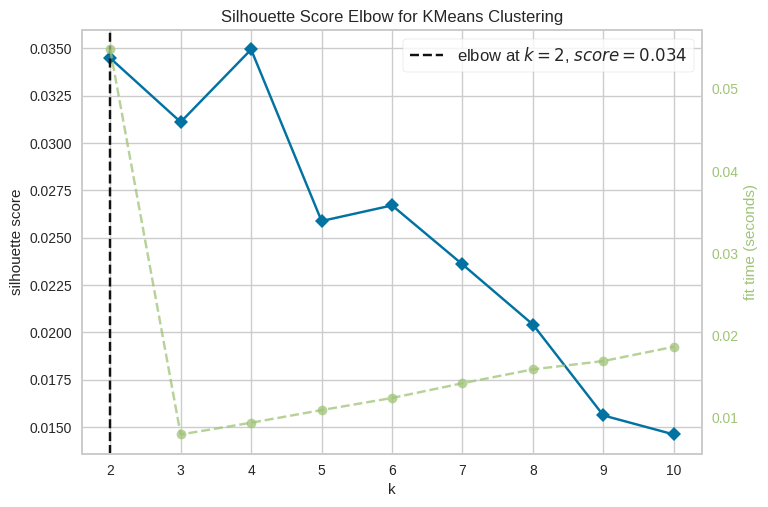

KElbowVisualizer(ax=<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>,
                 estimator=KMeans(n_clusters=10, n_init=10, random_state=10),
                 k=(2, 11), metric='silhouette')

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import Normalizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import kelbow_visualizer, silhouette_visualizer
import pandas as pd

text = [" ".join(noun) for noun in cl_tour['Nouns']]
# vectorizer outlier processing
tfidf_vectorizer = TfidfVectorizer(sublinear_tf = True)
tfidf_matrix = tfidf_vectorizer.fit_transform(text)
normalizer = Normalizer()
tfidf_matrix = normalizer.fit_transform(tfidf_matrix)
kelbow_visualizer(KMeans(random_state=10, n_init=10), tfidf_matrix.toarray(), k=(2, 11), metric = 'silhouette')

In [ ]:
n_clusters = 4
kmeans_model = KMeans(n_clusters=n_clusters, random_state=10, n_init=10)
kmeans_model.fit(tfidf_matrix)

cl_tour['Label'] = kmeans_model.labels_

In [ ]:
cl_tour

,Region Name,Nouns,Label
0,철원,"[고석정, 한탄강, 폭포, 주상절리, 길, 맛집, 노동당사, 꽃밭, 노동, 삼부연폭...",0
1,화천,"[축제, 산천어, 마을, 겨울, 파로호, 평화, 길, 펜션, 맛집, 얼음, 비수구미...",1
2,양구,"[한반도섬, 박수근미술관, 섬, 미술관, 펜션, 연, 맛집, 볼, 파로호, 펀치, ...",1
3,인제,"[자작나무숲, 계곡, 맛집, 펜션, 대리, 백담사, 가족, 자작나무, 겨울, 마을,...",1
4,고성,"[숙소, 카페, 바다, 해변, 해수욕장, 맛집, 아야진해변, 오션, 아이, 뷰, 리...",3
5,춘천,"[닭갈비, 카페, 맛집, 당일치기, 숙소, 감자, 스카이워크, 소양강, 워, 아이,...",2
6,속초,"[맛집, 아이, 카페, 해수욕장, 바다, 숙소, 설악산, 중앙시장, 호텔, 대관람차...",3
7,양양,"[비치, 맛집, 낙산사, 서핑, 해변, 바다, 카페, 해수욕장, 숙소, 피, 쏠, ...",3
8,홍천,"[비발디파크, 파크, 펜션, 알파카월드, 가족, 월드, 카페, 맛집, 아이, 사, ...",1
9,강릉,"[해변, 맛집, 카페, 바다, 커피, 순두부, 호텔, 숙소, 안목해변, 강문해변, ...",3


In [ ]:
# 시각화 목적
from sklearn.decomposition import PCA

pca = PCA(n_components = 2, random_state = 42)

pca_vecs = pca.fit_transform(tfidf_matrix.toarray())

x0 = pca_vecs[:,0]
x1 = pca_vecs[:,1]

cl_tour['x0'] = x0
cl_tour['x1'] = x1

def get_top_keywords(n_terms):
    df = pd.DataFrame(tfidf_matrix.todense()).groupby(kmeans_model.labels_).mean()
    terms = tfidf_vectorizer.get_feature_names_out()
    for i,r in df.iterrows():
        print('\nCluster {}'.format(i))
        print(','.join([terms[t] for t in np.argsort(r)[-n_terms:]]))

get_top_keywords(10)


Cluster 0
포천,삼부연폭포,직탕,고석정,이산,철원역,한탄강,도피안사,은하,수교

Cluster 1
박물관,겨울,여름,펜션,축제,파크,가을,힐링,마을,체험

Cluster 2
치악산,금산,안도,아이,사진,호텔,시장,당일치기,서울,스카이워크

Cluster 3
숙소,카페,아이,방문,바위,오션,사진,해수욕장,해변,바다


In [ ]:
# cluster 0, 2: 자연관광
# cluster 1: 문화체험관광
# cluster 3: 레저스포츠관광

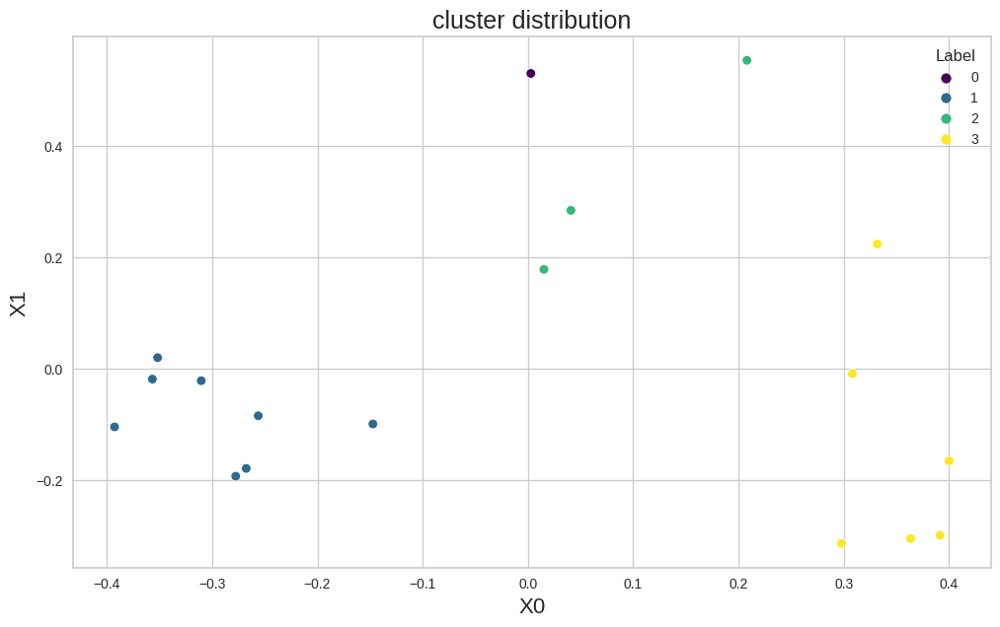

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 7))
plt.title("cluster distribution", fontdict={"fontsize": 18})
plt.xlabel("X0", fontdict={"fontsize": 16})
plt.ylabel("X1", fontdict={"fontsize": 16})
sns.scatterplot(data=cl_tour, x='x0', y='x1', hue='Label', palette="viridis")
plt.show()

In [ ]:
cl_tour

,Region Name,Nouns,Label,x0,x1
0,철원,"[고석정, 한탄강, 폭포, 주상절리, 길, 맛집, 노동당사, 꽃밭, 노동, 삼부연폭...",0,0.002784,0.529035
1,화천,"[축제, 산천어, 마을, 겨울, 파로호, 평화, 길, 펜션, 맛집, 얼음, 비수구미...",1,-0.351777,0.019881
2,양구,"[한반도섬, 박수근미술관, 섬, 미술관, 펜션, 연, 맛집, 볼, 파로호, 펀치, ...",1,-0.310342,-0.021349
3,인제,"[자작나무숲, 계곡, 맛집, 펜션, 대리, 백담사, 가족, 자작나무, 겨울, 마을,...",1,-0.392663,-0.104068
4,고성,"[숙소, 카페, 바다, 해변, 해수욕장, 맛집, 아야진해변, 오션, 아이, 뷰, 리...",3,0.297907,-0.312805
5,춘천,"[닭갈비, 카페, 맛집, 당일치기, 숙소, 감자, 스카이워크, 소양강, 워, 아이,...",2,0.040843,0.283792
6,속초,"[맛집, 아이, 카페, 해수욕장, 바다, 숙소, 설악산, 중앙시장, 호텔, 대관람차...",3,0.400161,-0.164972
7,양양,"[비치, 맛집, 낙산사, 서핑, 해변, 바다, 카페, 해수욕장, 숙소, 피, 쏠, ...",3,0.363540,-0.304159
8,홍천,"[비발디파크, 파크, 펜션, 알파카월드, 가족, 월드, 카페, 맛집, 아이, 사, ...",1,-0.267614,-0.178479
9,강릉,"[해변, 맛집, 카페, 바다, 커피, 순두부, 호텔, 숙소, 안목해변, 강문해변, ...",3,0.331871,0.223368


In [ ]:
cl_tour.rename(columns = {'Region Name' : 'SIG_KOR_NM'}, inplace = True)
town = ['고성','양구','양양','영월','인제','정선','철원','평창','홍천','화천','횡성']
city = ['강릉','동해','삼척','속초','원주','춘천','태백']

for i in range(len(cl_tour)):
  if cl_tour['SIG_KOR_NM'][i] in city:
    cl_tour['SIG_KOR_NM'][i] = cl_tour['SIG_KOR_NM'][i] + '시'
  else:
    cl_tour['SIG_KOR_NM'][i] = cl_tour['SIG_KOR_NM'][i] + '군'

<ipython-input-14-32b13cf21e17>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_tour['SIG_KOR_NM'][i] = cl_tour['SIG_KOR_NM'][i] + '군'
<ipython-input-14-32b13cf21e17>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_tour['SIG_KOR_NM'][i] = cl_tour['SIG_KOR_NM'][i] + '시'


In [ ]:
cl_tour['Label'] = cl_tour['Label'].astype('str')

In [ ]:
import plotly.express as px
import pandas as pd
import os
import json

geometry = json.load(open('/content/drive/MyDrive/2020년 교통접근성지표_20230720/TL_SCCO_SIG.json'))

fig = px.choropleth(cl_tour, geojson = geometry, locations='SIG_KOR_NM',
                    color='Label',  color_discrete_map={
                        '0': 'lightgreen',
                        '2': 'green',
                        '1': 'coral',
                        '3': 'lightblue'},
                    featureidkey='properties.SIG_KOR_NM')

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text='PLOT', title_font_size=20)

In [ ]:
# ROUTE1
# 신철원고속버스터미널
# 춘천시외버스터미널
# 원주종합버스터미널

r1_lon = [127.308092, 127.718304, 127.930920]
r1_lat = [38.1453214, 37.8638025, 37.3448619]
r1_name = ['신철원고속버스터미널','춘천시외버스터미널','원주종합버스터미널']
r1_color = 'lightgreen'

#ROUTE2
# 원주종합버스터미널
# 정선시외버스터미널

r2_lon = [127.930920, 128.650270]
r2_lat = [37.3448619, 37.3788965]
r2_name = ['원주종합버스터미널','정선시외버스터미널']
r2_color = 'lightgreen'

# ROUTE3
# 간성시외버스터미널
# 속초시외버스터미널
# 양양종합여객터미널
# 강릉시외버스터미널

r3_lon = [128.472353, 128.591066, 128.630265, 128.880141]
r3_lat = [38.3791267, 38.2109562, 38.0844759, 37.7545510]
r3_name = ['간성시외버스터미널','속초시외버스터미널','양양시외버스터미널','강릉시외버스터미널']
r3_color = 'blue'

# ROUTE4
# 강릉시외버스터미널
# 동해종합버스터미널
# 삼척시외버스터미널

r4_lon = [128.880141, 129.103914, 129.168709]
r4_lat = [37.7545510, 37.5279334, 37.4401193]
r4_name = ['강릉시외버스터미널','동해종합버스터미널','삼척시외버스터미널']
r4_color = 'blue'

# ROUTE5
# 원주종합버스터미널
# 영월버스터미널
# 태백버스정류장

r5_lon = [127.930920, 128.465421, 128.985534]
r5_lat = [37.3448619, 37.1831108, 37.1766127]
r5_name = ['원주종합버스터미널','영월버스터미널','태백버스터미널']
r5_color = 'orange'

# ROUTE6
# 화천공영버스터미널
# 춘천시외버스터미널
# 양구시외버스터미널
# 인제터미널

r6_lon = [127.704253, 127.718304, 127.989360, 128.175037, 127.878607]
r6_lat = [38.1043310, 37.8638025, 38.1076847, 38.0659241, 37.6892789]
r6_name = ['화천공영버스터미널','춘천시외버스터미널','양구시외버스터미널','인제터미널','홍천터미널']
r6_color = 'orange'

# TRAIN
r7_lon = [128.009988, 128.220998, 128.429108, 128.573128]
r7_lat = [37.4832889, 37.5103094, 37.5619692, 37.6425264]
r7_name = ['횡성역','둔내역','평창역','진부역']
r7_color = 'orange'

In [ ]:
for i in range(1, 7):
  fig.add_scattergeo(
      lat = eval(f'r{i}_lat'),
      lon = eval(f'r{i}_lon'),
      mode = 'lines+markers',
      text = eval(f'r{i}_name'),
      marker_color= eval(f'r{i}_color')
      )

  fig.update_traces(
    marker = dict(size= 8, line = dict(width=2)),
    selector = dict(mode = 'markers')
    )

fig.add_scattergeo(
    lat = r7_lat,
    lon = r7_lon,
    mode = 'lines+markers',
    text = r7_name,
    marker_color = r7_color
)

fig.update_traces(
    marker = dict(size= 8, symbol= 'diamond',
                  line = dict(width=2)),
    selector = dict(mode = 'lines+markers')
    )

fig.show()

In [ ]:
# 관광지 그래프 추출 (인구/유형별 순)
# 언급량과 비교
# 지정하기

sights_all = pd.read_excel('/content/drive/MyDrive/강원도_데이터랩_1년/주요관광지점 입장객(2004.07 이후)_230729114824.xls')
sights_culture = pd.read_excel('/content/drive/MyDrive/강원도_데이터랩_1년/주요관광지점 입장객(2004.07 이후)_230729115009.xls')
sights_nature = pd.read_excel('/content/drive/MyDrive/강원도_데이터랩_1년/주요관광지점 입장객(2004.07 이후)_230729115025.xls')
sights_facility = pd.read_excel('/content/drive/MyDrive/강원도_데이터랩_1년/주요관광지점 입장객(2004.07 이후)_230729115037.xls')

In [ ]:
sights_culture.drop([0], axis = 0, inplace = True)
sights_culture = sights_culture.loc[sights_culture['내/외국인'] == '합계']
sights_culture.drop(sights_culture.columns[[5,6,7,8]], axis = 1, inplace = True)

<ipython-input-97-901f959fed27>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
sights_nature.drop([0], axis = 0, inplace = True)
sights_nature = sights_nature.loc[sights_nature['내/외국인'] == '합계']
sights_nature.drop(sights_nature.columns[[5,6,7,8]], axis = 1, inplace = True)

<ipython-input-100-73214e6f52a0>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
sights_facility.drop([0], axis = 0, inplace = True)
sights_facility = sights_facility.loc[sights_facility['내/외국인'] == '합계']
sights_facility.drop(sights_facility.columns[[5,6,7,8]], axis = 1, inplace = True)

<ipython-input-99-5fef2d9d5809>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
sights_all.drop([0], axis = 0, inplace = True)
sights_all = sights_all.loc[sights_all['내/외국인'] == '합계']
sights_all.drop(sights_all.columns[[5,6,7,8]], axis = 1, inplace = True)

<ipython-input-116-c7a303155df0>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
import plotly.express as px
for i in sights_all['군구'].unique().tolist():
  temp = sights_all[sights_all['군구'] == i]
  fig = px.bar(temp, x='관광지', y='총계')
  fig.update_layout(title = i,
                    xaxis = {"categoryorder":"total descending"},
                    yaxis_title = '관광객수')
  fig.show()

# 관광지 매치

In [ ]:
# cl 0,2 : 자연 힐링 관광
# cl 1: 문화 체험 관광
# cl 3: 해양 레저 관광

# cl 0,2
# 철원: 철원한탄강, 삼부연폭포, 고석정
# 춘천: 맛집투어(춘천닭갈비), 스카이워크, 남이섬유원지
# 원주: 뮤지엄산, 소금산그랜드밸리, 치악산국립공원
# 정선: 스카이워크, 하이원 스키장, 화암동굴

# cl 3
# 고성: 아야진해변, 리조트투어(소노캄델피노), 통일전망대
# 속초: 리조트투어(설악워터피아), 속초해수욕장, 중앙시장
# 양양: 낙산사, 서핑투어(서피비치), 맛집투어
# 강릉: 오죽헌시립박물관, 해변투어(안목해변), 맛집투어(강릉 순두부)
# 동해: 무릉계곡, 묵호항 도째비골, 해변투어(망상해변)
# 삼척: 해양레일바이크, 환선굴, 리조트투어(쏠비치)

# cl 1
# 화천: 산천어축제*, 파로호, 조경철천문대*
# 양구: 한반도섬, 박수근 미술관*, 두타연계곡
# 인제: 원대리 자작나무숲, 설악산국립공원, 백담사*
# 홍천: 홍천무궁화수목원, 알파카월드*, 리조트투어(비발디파크)
# 태백: 황지연못, 구문소, 축제투어(태백해바라기축제, 태백눈꽃축)*
# 영월: 한반도지형, 청령포, 젊은달와이파크*
# 평창: 오대산국립공원, 대관령 양떼목장*, 휘닉스 스키장
# 횡성: 맛집투어(한우), 루지체험*, 호수길